In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

import db
import pam
import utils as ut
import features as ft
import dtw
import clustering_evaluation as ce
import seq2seq as s2s

import time

from sklearn.cluster import KMeans,AgglomerativeClustering,DBSCAN
from sklearn.metrics import pairwise_distances,homogeneity_completeness_v_measure,silhouette_score,calinski_harabaz_score
import matplotlib.cm as cm
from sklearn.decomposition import PCA

# Get the data

In [2]:
DATA_PATH = "data/grl/"
DATA_BASE = DATA_PATH + "grl.sqlite"
SAVE_PATH = DATA_PATH + "generated_data/"
FRAME_PATH = DATA_PATH + "grl.png"
VIDEO_PATH = DATA_PATH + "grl.MOV"
HOMOGRAPHY = DATA_PATH + "homography.txt"
DISTANCES = SAVE_PATH + "distances/cityblock_50.txt"

### Load trajectories from path

In [3]:
trajectories_po,ids_po,nb_objects = db.get_trajectories_by_object(DATA_BASE)

### Unsupervised data

In [4]:
nb_trajectories_per_object_unsup = 1
trajectories_po_unsup,ids_po_unsup = db.filter_trajectories(nb_trajectories_per_object_unsup, trajectories_po, ids_po)

#total number of selected trajectories
nb_trajectories_unsup = nb_trajectories_per_object_unsup * nb_objects

# list of every selected trajectory, 
trajectories_unsup = [t for o in trajectories_po_unsup for t in o]
# ids of every selected trajectory
ids_unsup = [i for o in ids_po_unsup for i in o]
# trajectories in pixel space, for displaying purposes only
pixel_trajectories_unsup = [ut.to_pixel(t,HOMOGRAPHY) for t in trajectories_unsup]

In [5]:
nb_trajectories_unsup

2376

### Supervised data

In [6]:
nb_trajectories_per_object_sup = 5
trajectories_po_sup,ids_po_sup = db.filter_trajectories(nb_trajectories_per_object_sup, trajectories_po, ids_po)

#select subset of objects randomly
selected_objects = np.array(trajectories_po_sup)
selected_objects_ids = np.array(ids_po_sup)

nb_selected_objects = 20
np.random.seed(0)
ids_s = np.random.choice(np.arange(nb_objects),nb_selected_objects,replace = False)

selected_objects = selected_objects[ids_s]
selected_objects_ids = selected_objects_ids[ids_s]
#total number of selected trajectories
nb_trajectories_sup = nb_trajectories_per_object_sup * nb_selected_objects

pixel_trajectories_po_sup = [[ut.to_pixel(t,HOMOGRAPHY) for t in trajectories] for trajectories in selected_objects]


# list of every selected trajectory, 
trajectories_sup = [t for o in selected_objects for t in o]
# ids of every selected trajectory
ids_sup = [i for o in selected_objects_ids for i in o]
# trajectories in pixel space, for displaying purposes only
pixel_trajectories_sup = [ut.to_pixel(t,HOMOGRAPHY) for t in trajectories_sup]

In [7]:
nb_trajectories_sup

100

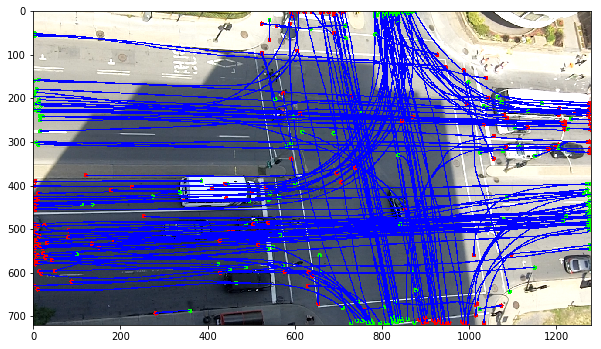

In [12]:
ut.plot_trajectories(FRAME_PATH,np.random.choice(pixel_trajectories_unsup,200))

### Visualize selected trajectories in pixel space (subset of objects)

The red dots are the beginnings of the trajectories, while the green ones are their ends

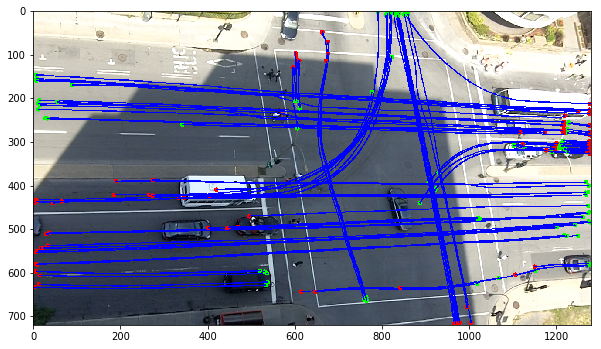

In [8]:
ut.plot_trajectories(FRAME_PATH,pixel_trajectories_sup)

### Training data

For seq2seq training, we take the best trajectory for each object.

In [6]:
import time
s = time.time()
diff_x,diff_y,diff_v,diff_r = s2s.extract_features(trajectories_unsup)
seq2seq_features = [s2s.behavior_feature_extraction(diff_x[i],diff_y[i],diff_v[i],diff_r[i]) for i in range(len(diff_x))]

seq2seq_data = s2s.minmax_scale_append_eos(seq2seq_features)

print(time.time()-s)

553.033185959


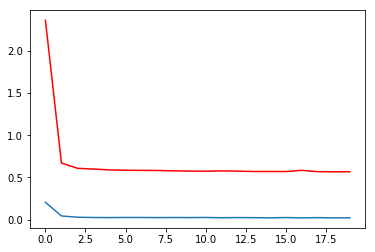

duration: 99.90071702
99.9041900635


In [7]:
import time
s = time.time()
encoder = s2s.seq2seq(seq2seq_data,hidden_size = 40,n_iters = 3000)
print(time.time()-s)

Now we know the model learnt properly, we can retrain it on the whole dataset

In [11]:
encoder = s2s.seq2seq(seq2seq_data,hidden_size = 40,train_ = 0)

best loss is: 0.00536849610507
duration: 29.9105138779


# Clustering eval

### Supervised

In [12]:
import time
s = time.time()
diff_x,diff_y,diff_v,diff_r = s2s.extract_features(trajectories_sup)
seq2seq_features_sup = [s2s.behavior_feature_extraction(diff_x[i],diff_y[i],diff_v[i],diff_r[i]) for i in range(len(diff_x))]

seq2seq_data_sup = s2s.minmax_scale_append_eos(seq2seq_features_sup)

print(time.time()-s)

24.6742351055


In [13]:
features_sup = s2s.unify_trajectory_sizes(encoder,seq2seq_data_sup)
pd.DataFrame(features_sup).to_csv(SAVE_PATH + "s2s_features_sup.csv",index = False)

### PCA

In [14]:
pca_sup = PCA(n_components=0.99)
features_pca_sup = pca_sup.fit_transform(features_sup)
pca_sup.n_components_

5

By applying PCA, we can keep 99% of the data variance with only 6 dimensions

In [15]:
#get the ground truth
labels_true = ce.get_ground_truth(ids_sup,selected_objects_ids)

In [16]:
nb_clusters = nb_selected_objects

#### KMEANS

In [17]:
best_random_state = ce.best_model_rand_init(100,features_pca_sup,labels_true,nb_clusters)

clusters = KMeans(n_clusters=nb_clusters, random_state = best_random_state).fit_predict(features_pca_sup)

(0.8715030878468057, 0.9232914266774996, 0.8966500875953362)


#### Hierarchical

In [18]:
clusters = AgglomerativeClustering(n_clusters = nb_clusters).fit_predict(features_pca_sup)
homogeneity_completeness_v_measure(labels_true, clusters)

(0.8512931232331898, 0.9052429995584598, 0.8774395588908817)

#### K-MEDOIDS

In [19]:
start = time.time()

distance_matrix = pairwise_distances(features_pca_sup,metric="manhattan")
medoids_idx, clusters =pam.pam(distance_matrix, nb_clusters)

print(time.time() - start)
homogeneity_completeness_v_measure(labels_true, clusters)

3.48405194283


(0.8556860811115532, 0.8862484719490707, 0.870699166648668)

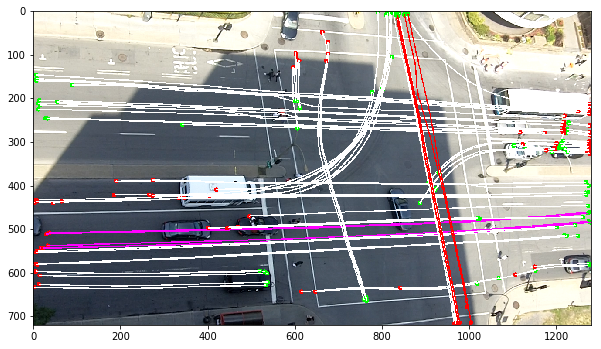

In [20]:
ut.plot_trajectories_by_groups(FRAME_PATH,pixel_trajectories_po_sup)

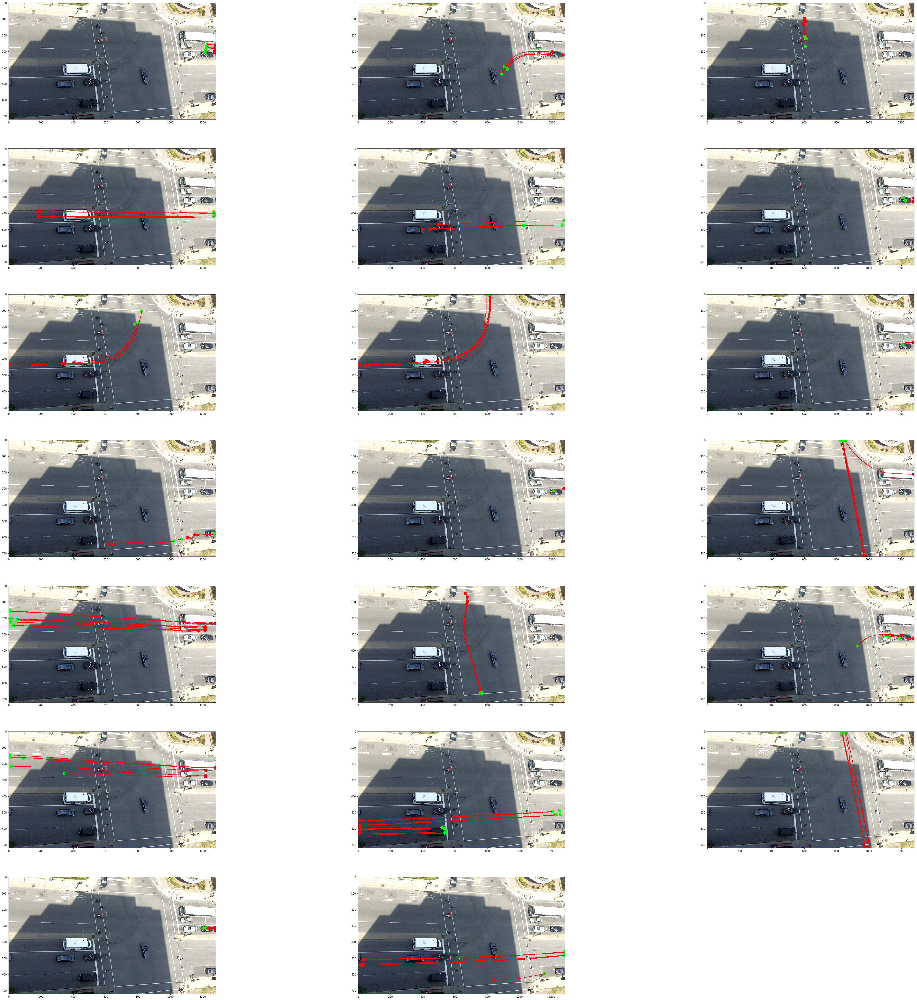

In [21]:
ut.display_clusters_oat_i(clusters,FRAME_PATH,pixel_trajectories_sup)

# Unsupervised

In [22]:
features_unsup = s2s.unify_trajectory_sizes(encoder,seq2seq_data)

In [23]:
pd.DataFrame(features_unsup).to_csv(SAVE_PATH + "s2s_features_unsup.csv",index = False)


### Trajectory discretization

In [24]:
pca_unsup = PCA(n_components=0.99)
features_pca_unsup = pca_unsup.fit_transform(features_unsup)
pca_unsup.n_components_

5

### KMEANS

In [25]:
max_clusters = 30
silhouette, _ = ce.u_clustering_eval(max_clusters,KMeans(random_state = best_random_state),features_pca_unsup)
np.argmax(silhouette)+2,np.max(silhouette)

(5, 0.5343951568623724)

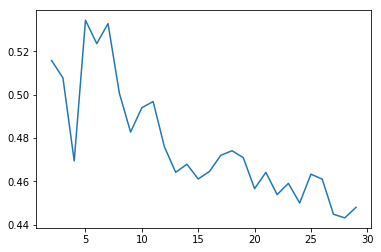

In [26]:
plt.plot(np.arange(2,max_clusters,1),silhouette)

### Hierarchical

In [27]:
max_clusters = 30
silhouette, _ = ce.u_clustering_eval(max_clusters,AgglomerativeClustering(),features_pca_unsup)
np.argmax(silhouette)+2,np.max(silhouette)

(5, 0.5180971503045342)

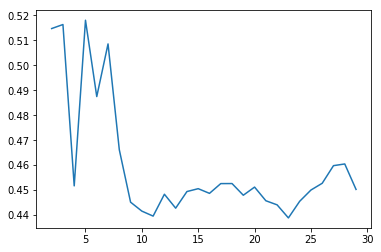

In [28]:
plt.plot(np.arange(2,max_clusters,1),silhouette)

### PAM

In [ ]:
max_clusters = 30
silhouette = []
calinski_index = []
for i in range(2,max_clusters):
    print(i)
    distance_matrix = pairwise_distances(features_pca_unsup,metric="manhattan")
    medoids_idx, clusters =pam.pam(distance_matrix, i)
    s = silhouette_score(features_pca_unsup, clusters, metric='euclidean')
    #c = calinski_harabaz_score(features, clusters) 
    silhouette.append(s)
    #calinski_index.append(c)

In [30]:
nb_clusters = 20

In [31]:
clusters = KMeans(n_clusters=nb_clusters, random_state = best_random_state).fit_predict(features_pca_unsup)

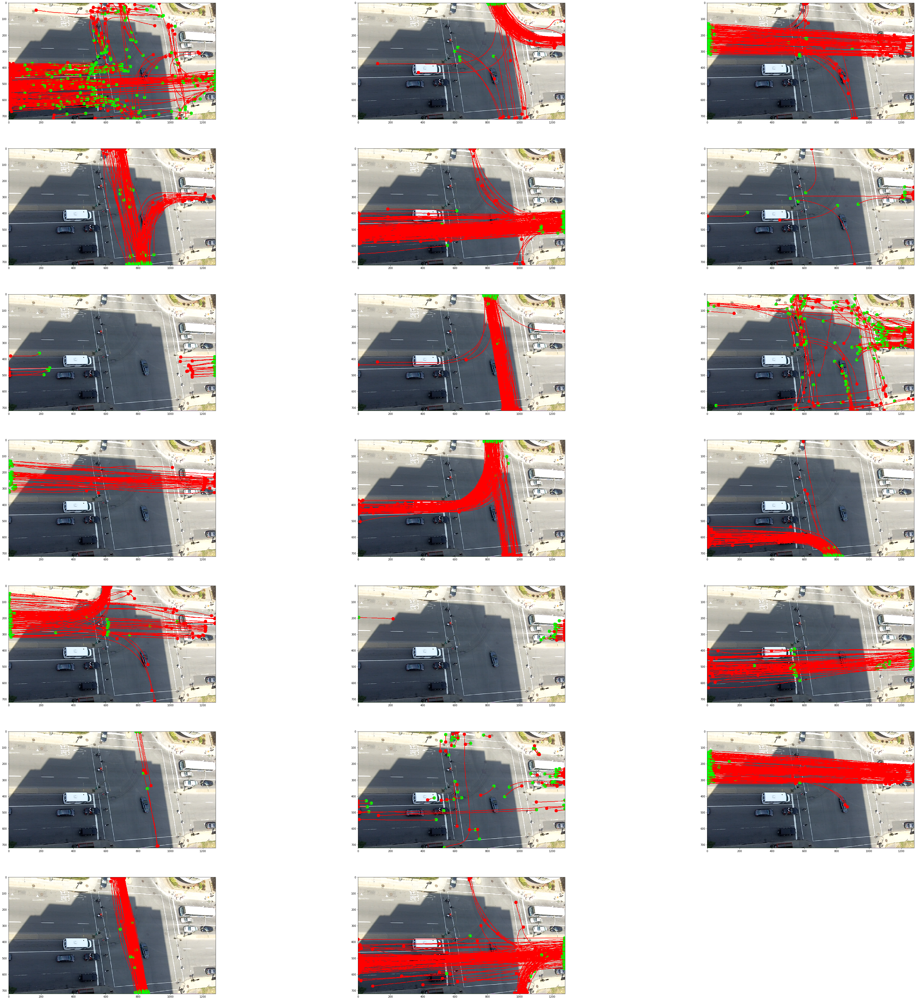

In [32]:
ut.display_clusters_oat_i(clusters,FRAME_PATH,pixel_trajectories_unsup)

In [ ]:
nb_clusters = 6
clusters = AgglomerativeClustering(n_clusters=nb_clusters).fit_predict(features_pca)

In [ ]:
ut.display_clusters_oat_i(clusters,FRAME_PATH,pixel_trajectories_unsup)

### Stats about clusters

mean x

In [ ]:
stats = ce.get_clusters_stats(trajectories_unsup,nb_clusters,clusters)
plt.bar(np.arange(0,nb_clusters),stats[:,0,0],yerr = stats[:,1,0])

mean y

In [ ]:
plt.bar(np.arange(0,nb_clusters),stats[:,0,1],yerr = stats[:,1,1])

mean velocity of a cluster

In [ ]:
plt.bar(np.arange(0,nb_clusters),stats[:,0,2],yerr = stats[:,1,2])

mean rate of turn of a cluster

In [ ]:
plt.bar(np.arange(0,nb_clusters),stats[:,0,3],yerr = stats[:,1,3])